In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import anndata
import os
import seaborn as sb
import matplotlib
from harmony import harmonize

In [2]:
import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

/tmp/ipykernel_1424162/2253401465.py:13: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()


In [10]:
adata = sc.read_h5ad("Altas_level1-noprototypes-allgenes-names-mse3-reload.h5ad") # output of level 1 reference training

In [91]:
def normalize_subset_first(adata, cell_types):
    if isinstance(cell_types, list):
        adata_1 = adata[adata.obs["cell_type_level1_all"].isin(cell_types)]
    else:
        adata_1 = adata[adata.obs["cell_type_level1_all"] == cell_types]
    adata_1.X = adata_1.layers["rounded_corrected_counts"]
    
    adata_pp = adata_1.copy()
    sc.pp.normalize_total(adata_pp, target_sum=1e6)
    sc.pp.log1p(adata_pp)
    sc.pp.pca(adata_pp, svd_solver="arpack")
    sc.pp.neighbors(adata_pp, n_pcs=30)
    sc.tl.leiden(adata_pp, key_added='groups', resolution=0.22)
    
    # Preprocess variables for scran normalization
    input_groups = adata_pp.obs['groups']
    data_mat = adata_1.X.T.toarray()
    del adata_pp
    
    return input_groups, data_mat, adata_1

In [48]:
def normalize_subset_second(adata_1, size_factors):
    adata_1.obs['size_factors'] = size_factors

    #Normalize adata 
    adata_1.X /= adata_1.obs['size_factors'].values[:,None]
    sc.pp.log1p(adata_1)
    # high variable genes selection
    sc.pp.highly_variable_genes(adata_1, n_top_genes=2000, subset=False)
    sc.pp.pca(adata_1, svd_solver="arpack", use_highly_variable=True)
    return adata_1

In [157]:
level1_marker = {
    'Bcell': ['CD79A', 'CD79B', 'MS4A1', 'IGKC', 'CD22', 'FCER2'],
    'Plasma cell': ['IGKC', 'IGHM', 'IGHA1', 'IGLC2', 'IGLC3', 'JCHAIN'],
    'Tcell': ['CD2', 'TRAC', 'CD69', 'CD3D', 'CD3E', 'CD4', 'CD8A', 'CD8B', 'EOMES', 'LAG3'],
    'NK': ['NKG7', 'XCL1', 'CTSW', 'XCL2', 'CD160', 'FCGR3A', 'PRF1', 'GNLY'],
    'DC': ['CLEC10A', 'FCER1A', 'CD1C', 'HLA-DRA', 'HLA-DRB1'],
    #"cdc1" : ["CLEC9A", "IRF8", "SNX3"],
    #"cdc2" : ["CD1C", "CLEC10A", "FCER1A"],
    #"mature dc" : ["CD40", "CD200", "TNFRSF4", "CD274", "LAMP3", "MARCKSL1", "IDO1"],
    "pDC" : ['CLEC4C', 'LILRA4', 'IL3RA', 'TCF4', 'TCL1A', 'SPIB', 'GZMB', 'NRP1', 'IRF7', 'IRF8', 'SLC15A4'],
    'EC': ['PECAM1', 'VWF', 'FABP4', 'CLDN5', 'IFI27', 'ECSCR', 'DYSF', 'CD34', 'COL4A1', 'COL4A2', 'SPARCL1', 'PLVAP', 'MPZL2', 'SULF1', 'EDN1'],
    'Fibroblast': ['LUM', 'DCN', 'COL1A1', 'COL1A2', 'FBLN1', 'THY1', "C3", "C7"],
    'Fibromyocyte': ['FN1', 'LUM', 'TNFRSF11B', 'ACTA2', 'TCF21'],
    'Fibromyocyte_miller': ["FN1", "VCAN", "LTBP1", "COL4A2", "COL6A2"],
    'SMC': ['ACTA2', 'MYH11', 'MYL9', 'TPM2', 'CALD1', 'TAGLN', 'TNFRSF11B', 'LUM', 'APOE', 'APOC1', 'AGT', 'NOTCH3', 'PDGFRB', 'MFAP4'],
    'Macrophage': ['C1QA', 'C1QB', 'C1QC', 'CD74', 'CXCL8', 'AIF1', 'CD14', 'CD68', 'ITGAM', 'CSF1R', 'HLA-DRA', 'LGALS3'],
    'Monocyte': ['FCN1', 'S100A8', 'S100A9', 'S100A12', 'VCAN', 'CD52', 'LYZ', 'CTSS'],
    'Mast': ['TPSAB1', 'TPSB2', 'KIT', 'HDC', 'CMA1'],
    'Neuron': ['PLP1']
}

marker_genes_in_data = {}
for celltype in level1_marker:
    marker_genes_in_data[celltype] = list(set(level1_marker[celltype]).intersection(adata.var_names))
    print(celltype, len(set(level1_marker[celltype]).intersection(adata.var_names))/len(level1_marker[celltype]))
    print("not included: ", set(level1_marker[celltype]).difference(adata.var_names))

Bcell 1.0
not included:  set()
Plasma cell 1.0
not included:  set()
Tcell 1.0
not included:  set()
NK 1.0
not included:  set()
DC 1.0
not included:  set()
pDC 1.0
not included:  set()
EC 0.9333333333333333
not included:  {'ECSCR'}
Fibroblast 1.0
not included:  set()
Fibromyocyte 1.0
not included:  set()
Fibromyocyte_miller 1.0
not included:  set()
SMC 1.0
not included:  set()
Macrophage 1.0
not included:  set()
Monocyte 1.0
not included:  set()
Mast 1.0
not included:  set()
Neuron 1.0
not included:  set()


# T cells

In [29]:
adata_tc = sc.read_h5ad("tmp_Tcells_adata_mse3-reload.h5ad")

In [30]:
adata_tc.obsm["Harmony"] = harmonize(adata_tc.obsm["X_pca"], adata_tc.obs, batch_key="dataset")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
Reach convergence after 5 iteration(s).


In [31]:
adata_tc.write("tmp_Tcells_adata_mse3-reload-harm.h5ad")

In [32]:
sc.pp.neighbors(adata_tc, use_rep="Harmony")
sc.tl.umap(adata_tc)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [33]:
sc.tl.leiden(adata_tc, resolution = 0.65)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_ac

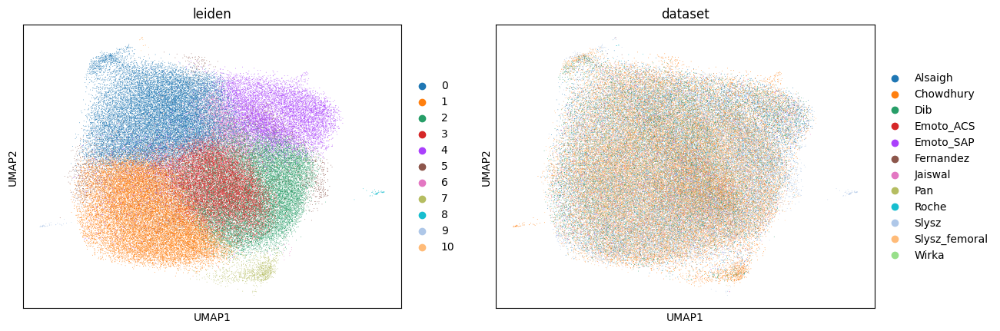

In [34]:
sc.pl.umap(adata_tc, color= ['leiden', "dataset"])

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

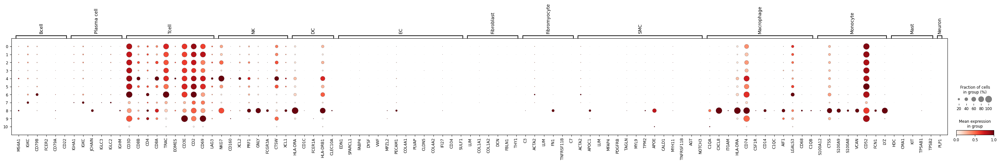

In [38]:
sc.pl.dotplot(
    adata_tc,
    groupby="leiden",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [39]:
corrected_annotation = {
    "0": "T cell",
    "1": "T cell",
    "2": "T cell",
    "3": "T cell",
    "4": "T cell",
    "5": "T cell", 
    "6": "T cell", 
    "7": "unknown",
    "8": "unknown",
    "9": "T cell",
    "10": "unknown"
}
adata_tc.obs["cell_type_level1_corrected"] = adata_tc.obs.leiden.map(corrected_annotation)

In [42]:
adata_tc.obs["cell_type_level1_corrected"].value_counts()

cell_type_level1_corrected
T cell     85937
unknown     1146
Name: count, dtype: int64

In [43]:
adata_tc.write("tmp_Tcells_adata_mse3-reload-harm-corrected.h5ad")

# ECs

In [26]:
adata_ec = sc.read_h5ad("tmp_ecs_adata_mse3-reload.h5ad")

In [27]:
adata_ec.obsm["Harmony"] = harmonize(adata_ec.obsm["X_pca"], adata_ec.obs, batch_key="dataset")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
Reach convergence after 10 iteration(s).


In [28]:
adata_ec.write("tmp_ecs_adata_mse3-reload-harm.h5ad")

In [44]:
sc.pp.neighbors(adata_ec, use_rep="Harmony")
sc.tl.umap(adata_ec)

In [45]:
sc.tl.leiden(adata_ec, resolution = 0.5)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_ac

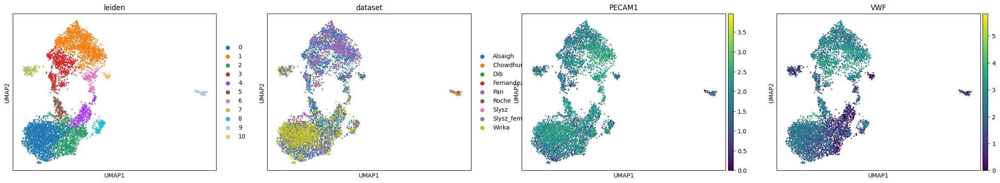

In [51]:
sc.pl.umap(adata_ec, color= ['leiden', "dataset", "PECAM1", "VWF"])

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

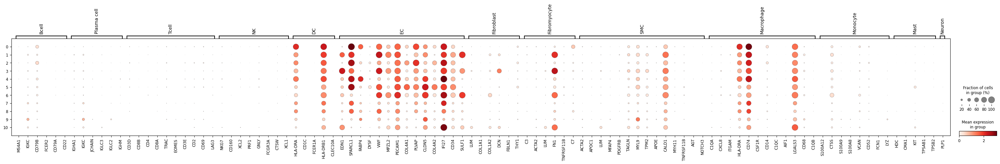

In [49]:
sc.pl.dotplot(
    adata_ec,
    groupby="leiden",
    var_names=marker_genes_in_data,
    #standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [52]:
corrected_annotation = {
    "0": "EC",
    "1": "EC",
    "2": "EC",
    "3": "EC",
    "4": "EC",
    "5": "EC", 
    "6": "EC", 
    "7": "EC",
    "8": "EC",
    "9": "EC",
    "10": "EC"
}
adata_ec.obs["cell_type_level1_corrected"] = adata_ec.obs.leiden.map(corrected_annotation)

In [53]:
adata_ec.write("tmp_ecs_adata_mse3-reload-harm-corrected.h5ad")

# Macrophages

In [23]:
adata_macros = sc.read_h5ad("tmp_macros_adata_mse3-reload.h5ad")

In [24]:
adata_macros.obsm["Harmony"] = harmonize(adata_macros.obsm["X_pca"], adata_macros.obs, batch_key="dataset")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).


In [25]:
adata_macros.write("tmp_macros_adata_mse3-reload-harm.h5ad")

In [54]:
sc.pp.neighbors(adata_macros, use_rep="Harmony")
sc.tl.umap(adata_macros)

In [55]:
sc.tl.leiden(adata_macros, resolution = 0.5)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_ac

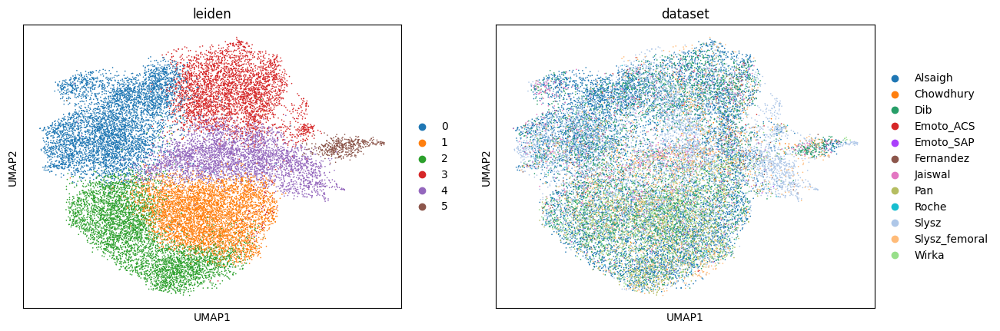

In [56]:
sc.pl.umap(adata_macros, color= ['leiden', "dataset"])

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

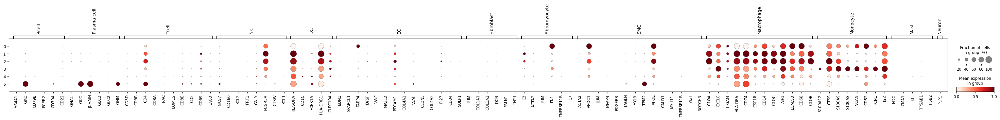

In [58]:
sc.pl.dotplot(
    adata_macros,
    groupby="leiden",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [59]:
corrected_annotation = {
    "0": "Macrophage",
    "1": "Macrophage",
    "2": "Macrophage",
    "3": "Monocyte",
    "4": "unknown",
    "5": "unknown", # these are pDCs, found out later
}
adata_macros.obs["cell_type_level1_corrected"] = adata_macros.obs.leiden.map(corrected_annotation)

In [60]:
adata_macros.write("tmp_macros_adata_mse3-reload-harm-corrected.h5ad")

In [163]:
# look at pDCs
adata_macros = sc.read_h5ad("tmp_macros_adata_mse3-reload-harm-corrected.h5ad")

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

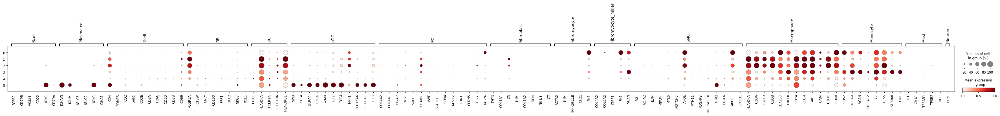

In [164]:
sc.pl.dotplot(
    adata_macros,
    groupby="leiden",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [165]:
corrected_annotation = {
    "0": "Macrophage",
    "1": "Macrophage",
    "2": "Macrophage",
    "3": "Monocyte",
    "4": "unknown",
    "5": "Dendritic cell", # these are pDCs, found out later
}
adata_macros.obs["cell_type_level1_corrected"] = adata_macros.obs.leiden.map(corrected_annotation)

In [166]:
adata_macros.write("tmp_macros_adata_mse3-reload-harm-corrected2.h5ad")

# DCs

In [20]:
adata_dc = sc.read_h5ad("tmp_DC_adata_mse3-reload.h5ad")

In [21]:
adata_dc.obsm["Harmony"] = harmonize(adata_dc.obsm["X_pca"], adata_dc.obs, batch_key="dataset")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).


In [22]:
adata_dc.write("tmp_DC_adata_mse3-reload-harm.h5ad")

In [4]:
adata_dc = sc.read_h5ad("tmp_DC_adata_mse3-reload-harm.h5ad")

In [5]:
sc.pp.neighbors(adata_dc, use_rep="Harmony")
sc.tl.umap(adata_dc)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
sc.tl.leiden(adata_dc, resolution = 0.5)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_ac

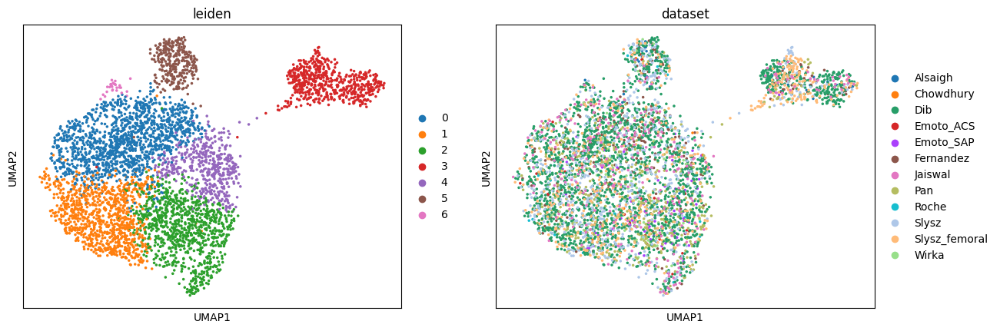

In [7]:
sc.pl.umap(adata_dc, color= ['leiden', "dataset"])

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

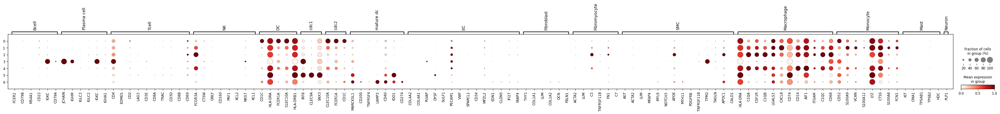

In [12]:
sc.pl.dotplot(
    adata_dc,
    groupby="leiden",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [14]:
corrected_annotation = {
    "0": "Dendritic cell", # cDC2
    "1": "unknown",
    "2": "Macrophage",
    "3": "unknown", # these are pDCs, found out later after mapping
    "4": "unknown",
    "5": "Dendritic cell", # cDC1
    "6": "unknown"
}
adata_dc.obs["cell_type_level1_corrected"] = adata_dc.obs.leiden.map(corrected_annotation)

In [15]:
adata_dc.write("tmp_DC_adata_mse3-reload-harm-corrected.h5ad")

In [155]:
# look at potential pDC cluster

In [167]:
adata_dc = sc.read_h5ad("tmp_DC_adata_mse3-reload-harm-corrected.h5ad")

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

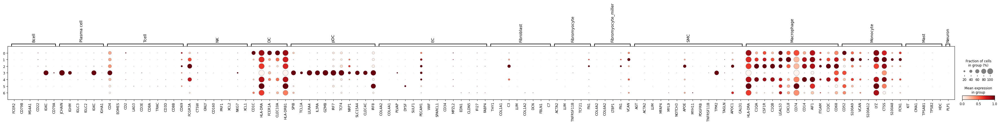

In [168]:
sc.pl.dotplot(
    adata_dc,
    groupby="leiden",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [169]:
corrected_annotation = {
    "0": "Dendritic cell", # cDC2
    "1": "unknown",
    "2": "Macrophage",
    "3": "Dendritic cell", # these are pDCs, found out later after mapping
    "4": "unknown",
    "5": "Dendritic cell", # cDC1
    "6": "unknown"
}
adata_dc.obs["cell_type_level1_corrected"] = adata_dc.obs.leiden.map(corrected_annotation)

In [170]:
adata_dc.write("tmp_DC_adata_mse3-reload-harm-corrected2.h5ad")

In [11]:
adata_dc = sc.read_h5ad("tmp_DC_adata_mse3-reload-harm-corrected2.h5ad")

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


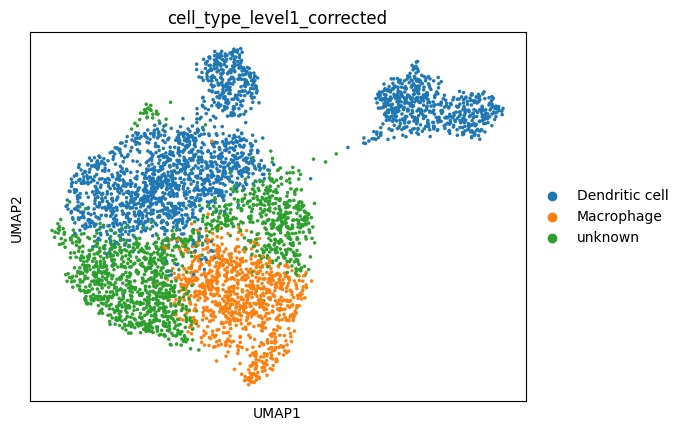

In [12]:
sc.pl.umap(adata_dc, color= ['cell_type_level1_corrected'])

# NK

In [17]:
adata_nk = sc.read_h5ad("tmp_nk_adata_mse3-reload.h5ad")

In [18]:
adata_nk.obsm["Harmony"] = harmonize(adata_nk.obsm["X_pca"], adata_nk.obs, batch_key="dataset")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).


In [19]:
adata_nk.write("tmp_nk_adata_mse3-reload-harm.h5ad")

In [16]:
adata_nk = sc.read_h5ad("tmp_nk_adata_mse3-reload-harm.h5ad")

In [17]:
sc.pp.neighbors(adata_nk, use_rep="Harmony")
sc.tl.umap(adata_nk)

In [18]:
sc.tl.leiden(adata_nk, resolution = 0.5)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_ac

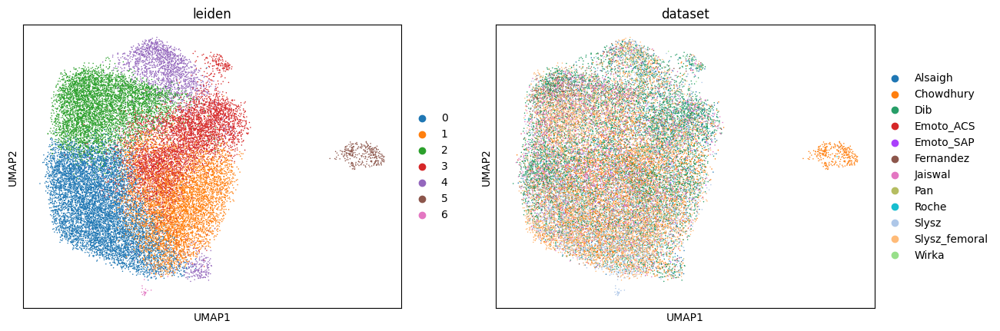

In [19]:
sc.pl.umap(adata_nk, color= ['leiden', "dataset"])

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

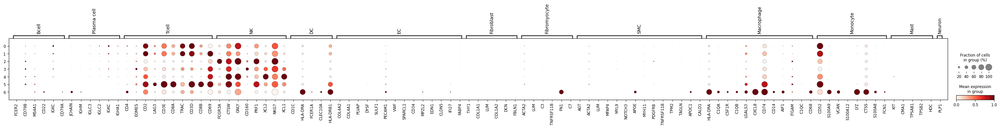

In [22]:
sc.pl.dotplot(
    adata_nk,
    groupby="leiden",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [23]:
corrected_annotation = {
    "0": "T cell", 
    "1": "T cell",
    "2": "NK cell",
    "3": "unknown",
    "4": "NK cell",
    "5": "T cell", 
    "6": "unknown"
}
adata_nk.obs["cell_type_level1_corrected"] = adata_nk.obs.leiden.map(corrected_annotation)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


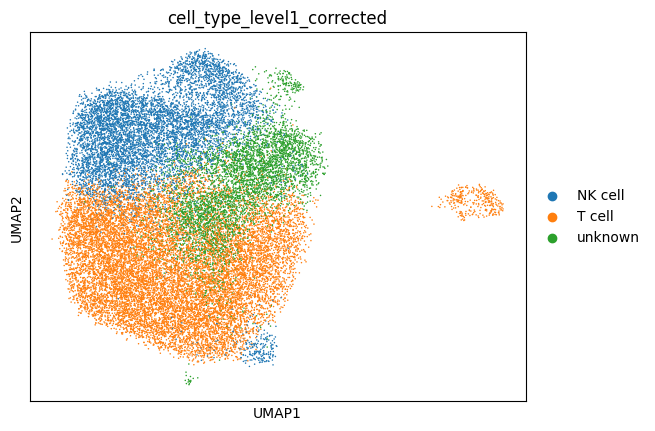

In [24]:
sc.pl.umap(adata_nk, color= ["cell_type_level1_corrected"])

In [25]:
adata_nk.write("tmp_nk_adata_mse3-reload-harm-corrected.h5ad")

In [161]:
adata_nk = sc.read_h5ad("tmp_nk_adata_mse3-reload-harm-corrected.h5ad")

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

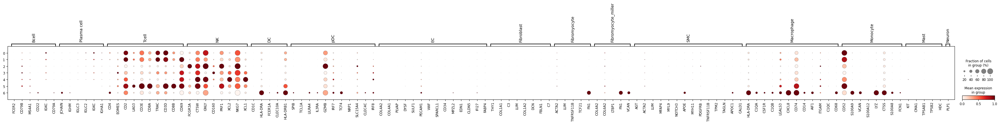

In [162]:
sc.pl.dotplot(
    adata_nk,
    groupby="leiden",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

# B cells

In [14]:
adata_bc = sc.read_h5ad("tmp_Bcells_adata_mse3-reload.h5ad")

In [15]:
adata_bc.obsm["Harmony"] = harmonize(adata_bc.obsm["X_pca"], adata_bc.obs, batch_key="dataset")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).


In [16]:
adata_bc.write("tmp_Bcells_adata_mse3-reload-harm.h5ad")

In [26]:
adata_bc = sc.read_h5ad("tmp_Bcells_adata_mse3-reload-harm.h5ad")

In [27]:
sc.pp.neighbors(adata_bc, use_rep="Harmony")
sc.tl.umap(adata_bc)

In [28]:
sc.tl.leiden(adata_bc, resolution = 0.5)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_ac

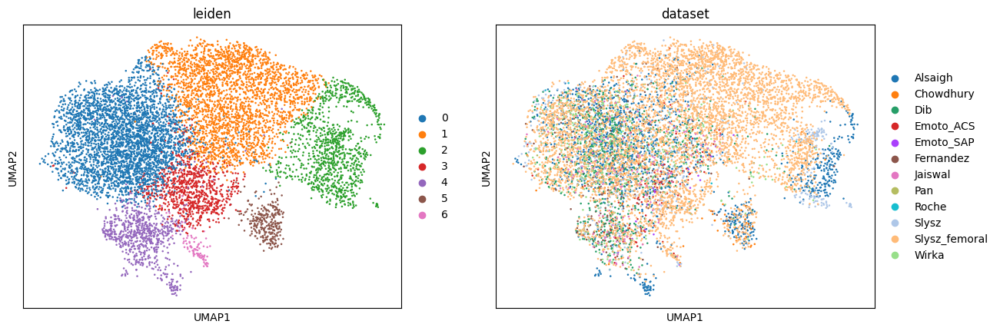

In [29]:
sc.pl.umap(adata_bc, color= ['leiden', "dataset"])

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

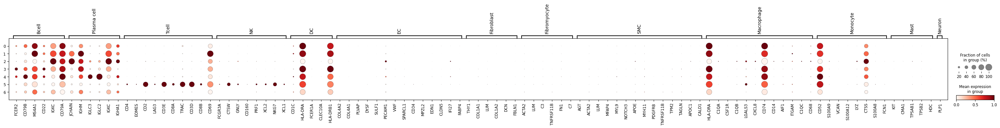

In [30]:
sc.pl.dotplot(
    adata_bc,
    groupby="leiden",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [31]:
corrected_annotation = {
    "0": "B cell", 
    "1": "B cell",
    "2": "B cell",
    "3": "B cell",
    "4": "B cell",
    "5": "T cell", 
    "6": "unknown"
}
adata_bc.obs["cell_type_level1_corrected"] = adata_bc.obs.leiden.map(corrected_annotation)

In [32]:
adata_bc.write("tmp_Bcells_adata_mse3-reload-harm-corrected.h5ad")

# Monocytes

In [11]:
adata_mono = sc.read_h5ad("tmp_mono_adata_mse3-reload.h5ad")

In [12]:
adata_mono.obsm["Harmony"] = harmonize(adata_mono.obsm["X_pca"], adata_mono.obs, batch_key="dataset")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).


In [13]:
adata_mono.write("tmp_mono_adata_mse3-reload-harm.h5ad")

In [2]:
adata_mono = sc.read_h5ad("tmp_mono_adata_mse3-reload-harm.h5ad")

In [3]:
sc.pp.neighbors(adata_mono, use_rep="Harmony")
sc.tl.umap(adata_mono)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
sc.tl.leiden(adata_mono, resolution = 0.5)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_ac

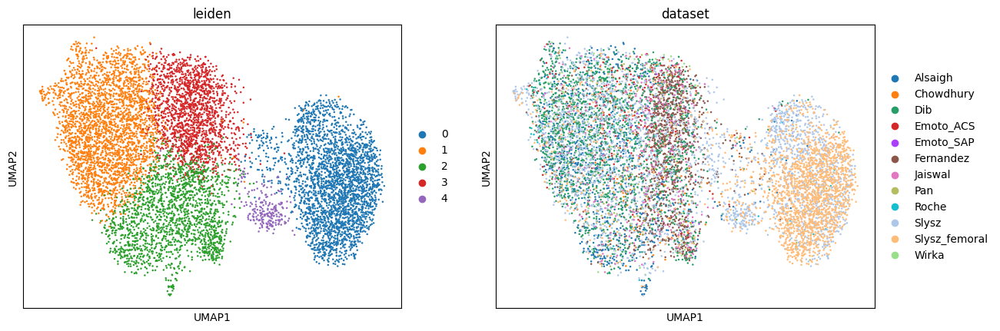

In [5]:
sc.pl.umap(adata_mono, color= ['leiden', "dataset"])

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

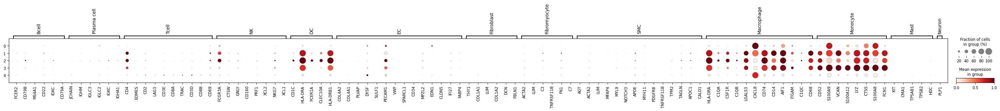

In [37]:
sc.pl.dotplot(
    adata_mono,
    groupby="leiden",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [38]:
corrected_annotation = {
    "0": "Neutrophil", 
    "1": "Monocyte",
    "2": "Macrophage",
    "3": "Monocyte",
    "4": "Neutrophil",
}
adata_mono.obs["cell_type_level1_corrected"] = adata_mono.obs.leiden.map(corrected_annotation)

In [39]:
adata_mono.write("tmp_mono_adata_mse3-reload-harm-corrected.h5ad")

In [ ]:
# get neutrophil marker genes

In [6]:
adata_mono = sc.read_h5ad("tmp_mono_adata_mse3-reload-harm-corrected.h5ad")

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_ac

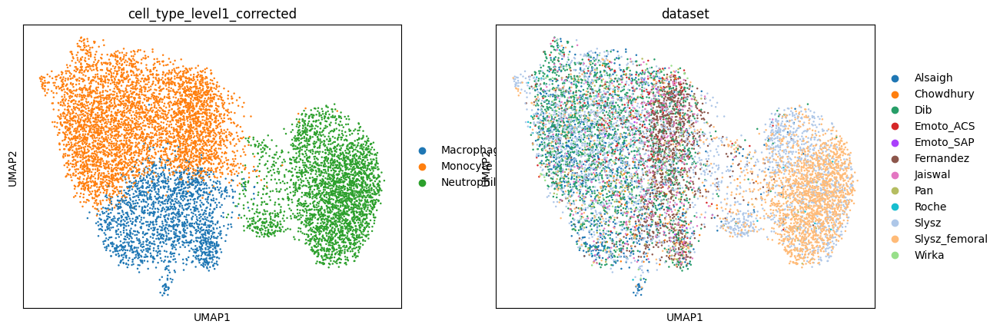

In [8]:
sc.pl.umap(adata_mono, color= ['cell_type_level1_corrected', "dataset"])

In [10]:
adata_mono.obs['cell_type_level1_corrected'] = adata_mono.obs['cell_type_level1_corrected'].astype(str)
# Step 1: Perform differential expression analysis
sc.tl.rank_genes_groups(
    adata_mono,
    groupby='cell_type_level1_corrected',    # The column in adata.obs that contains cluster labels
    groups=["Neutrophil"],        # The cluster(s) of interest; here, cluster '1'
    reference='rest',    # Compare against all other clusters
    method='t-test'      # Statistical test method (can be changed as needed)
)

# Step 2: Extract the results for cluster 1
# The results are stored in adata.uns['rank_genes_groups']
# It's a dictionary containing arrays for names, scores, pvals, etc.

# Get the names of the top 10 genes
top_genes = adata_mono.uns['rank_genes_groups']['names']["Neutrophil"][:10]

# Step 3: Print or further analyze the top genes
print("Top 10 DEGs in potential Neutrophil cluster compared to the rest:")
for idx, gene in enumerate(top_genes, start=1):
    print(f"'{gene}',")

Top 10 DEGs in potential Neutrophil cluster compared to the rest:
'NAMPT',
'IFITM2',
'G0S2',
'CXCL8',
'SOD2',
'NEAT1',
'FCGR3B',
'SRGN',
'IVNS1ABP',
'AQP9',


# Fibro/fibromyo/smc 

In [92]:
input_groups, data_mat, adata_out = normalize_subset_first(adata, ["Fibromyocyte", "Fibroblast", "SMC"])

In [93]:
%%R -i data_mat -i input_groups -o size_factors
library(scran)
size_factors = calculateSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

In addition: Warning message:
In (function (x, sizes, min.mean = NULL, positive = FALSE, scaling = NULL)  :
  encountered non-positive size factor estimates


In [94]:
adata_fibrossmc = normalize_subset_second(adata_out, size_factors)

/tmp/ipykernel_1424162/2282018356.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_1.obs['size_factors'] = size_factors


/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


In [95]:
adata_fibrossmc

AnnData object with n_obs × n_vars = 17420 × 28488
    obs: 'dataset', 'cell_type', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'scDblFinder.sample', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'symptoms', 'n_genes', 'n_counts', 'size_factors', 'cell_type_level1', 'cell_type_level1_all'
    var: 'original_gene_names', 'ensembl_id', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'raw_decontXcounts', 'rounded_corrected_counts', 'uncorrected_counts'

In [96]:
adata_fibrossmc.obsm["Harmony"] = harmonize(adata_fibrossmc.obsm["X_pca"], adata_fibrossmc.obs, batch_key="dataset")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
Reach convergence after 10 iteration(s).


In [97]:
adata_fibrossmc.write("tmp_fibrossmc_adata_mse3-reload-harm.h5ad")

In [98]:
sc.pp.neighbors(adata_fibrossmc, use_rep="Harmony")
sc.tl.umap(adata_fibrossmc)

In [99]:
sc.tl.leiden(adata_fibrossmc, resolution = 0.5)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_ac

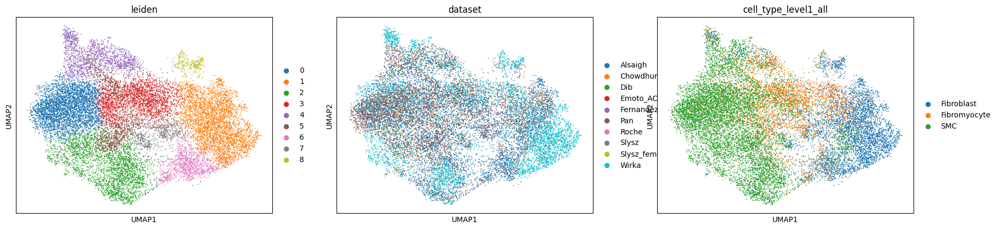

In [105]:
sc.pl.umap(adata_fibrossmc, color= ['leiden', "dataset", "cell_type_level1_all"])

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

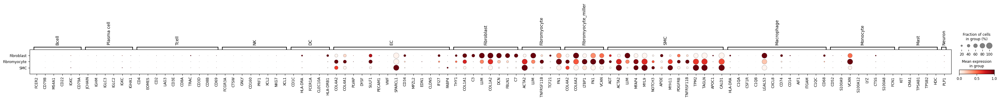

In [104]:
sc.pl.dotplot(
    adata_fibrossmc,
    groupby="cell_type_level1_all",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

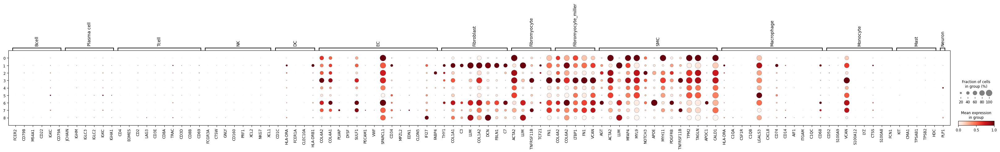

In [110]:
sc.pl.dotplot(
    adata_fibrossmc,
    groupby="leiden",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [111]:
corrected_annotation = {
    "0": "Smooth Muscle Cell", 
    "1": "Fibroblast",
    "2": "Smooth Muscle Cell",
    "3": "Fibromyocyte",
    "4": "Smooth Muscle Cell",
    "5": "Smooth Muscle Cell", 
    "6": "Fibroblast", 
    "7": "unknown", 
    "8": "Fibroblast", 
    
}
adata_fibrossmc.obs["cell_type_level1_corrected"] = adata_fibrossmc.obs.leiden.map(corrected_annotation)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_ac

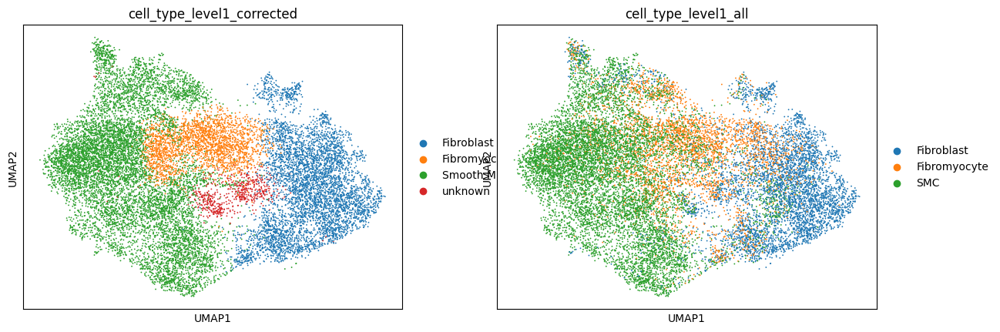

In [112]:
sc.pl.umap(adata_fibrossmc, color= ["cell_type_level1_corrected", "cell_type_level1_all"])

In [113]:
adata_fibrossmc.write("tmp_fibrossmc_adata_mse3-reload-harm-corrected.h5ad")

# Mast cell

In [62]:
input_groups, data_mat, adata_out = normalize_subset_first(adata, "Mast cell")

In [63]:
%%R -i data_mat -i input_groups -o size_factors
library(scran)
size_factors = calculateSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

In addition: Warning messages:
1: In (function (x, sizes, min.mean = NULL, positive = FALSE, scaling = NULL)  :
  encountered non-positive size factor estimates
2: In (function (x, sizes, min.mean = NULL, positive = FALSE, scaling = NULL)  :
  encountered non-positive size factor estimates


In [64]:
adata_mast = normalize_subset_second(adata_out, size_factors)

/tmp/ipykernel_1424162/2282018356.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_1.obs['size_factors'] = size_factors
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


In [65]:
adata_mast.write("tmp_mast_adata_mse3-reload.h5ad")

In [72]:
adata_mast.obsm["Harmony"] = harmonize(adata_mast.obsm["X_pca"], adata_mast.obs, batch_key="dataset")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).


In [73]:
adata_mast.write("tmp_mast_adata_mse3-reload-harm.h5ad")

In [114]:
adata_mast = sc.read_h5ad("tmp_mast_adata_mse3-reload-harm.h5ad")

In [115]:
sc.pp.neighbors(adata_mast, use_rep="Harmony")
sc.tl.umap(adata_mast)

In [116]:
sc.tl.leiden(adata_mast, resolution = 0.5)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_ac

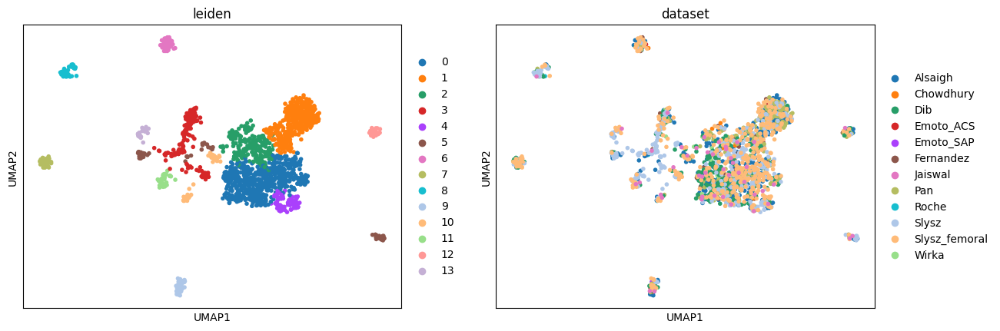

In [117]:
sc.pl.umap(adata_mast, color= ['leiden', "dataset"])

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

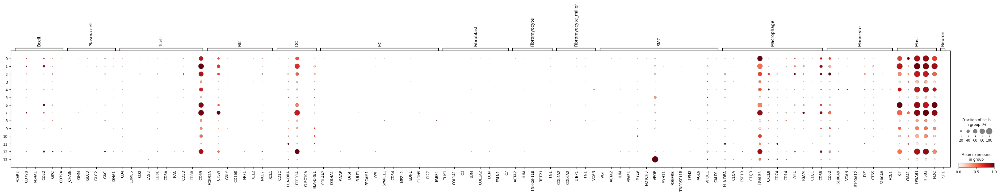

In [119]:
sc.pl.dotplot(
    adata_mast,
    groupby="leiden",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [123]:
corrected_annotation = {
    "0": "Mast cell", 
    "1": "Mast cell",
    "2": "Mast cell",
    "3": "unknown",
    "4": "Mast cell",
    "5": "unknown",
    "6": "Mast cell",
    "7": "Mast cell",
    "8": "unknown",
    "9": "Mast cell",
    "10": "Mast cell",
    "11": "unknown",
    "12": "Mast cell",
    "13": "unknown",
}
adata_mast.obs["cell_type_level1_corrected"] = adata_mast.obs.leiden.map(corrected_annotation)

In [124]:
adata_mast.write("tmp_mast_adata_mse3-reload-harm-corrected.h5ad")

# Plasma cell

In [66]:
input_groups, data_mat, adata_out = normalize_subset_first(adata, "Plasma cell")

In [67]:
%%R -i data_mat -i input_groups -o size_factors
library(scran)
size_factors = calculateSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

In addition: Warning message:
In (function (x, sizes, min.mean = NULL, positive = FALSE, scaling = NULL)  :
  encountered non-positive size factor estimates


In [68]:
adata_plasma = normalize_subset_second(adata_out, size_factors)

/tmp/ipykernel_1424162/2282018356.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_1.obs['size_factors'] = size_factors
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


In [69]:
adata_plasma.write("tmp_plasma_adata_mse3-reload.h5ad")

In [70]:
adata_plasma.obsm["Harmony"] = harmonize(adata_plasma.obsm["X_pca"], adata_plasma.obs, batch_key="dataset")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).


In [71]:
adata_plasma.write("tmp_plasma_adata_mse3-reload-harm.h5ad")

In [125]:
adata_plasma = sc.read_h5ad("tmp_plasma_adata_mse3-reload-harm.h5ad")

In [126]:
sc.pp.neighbors(adata_plasma, use_rep="Harmony")
sc.tl.umap(adata_plasma)

In [127]:
sc.tl.leiden(adata_plasma, resolution = 0.5)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_ac

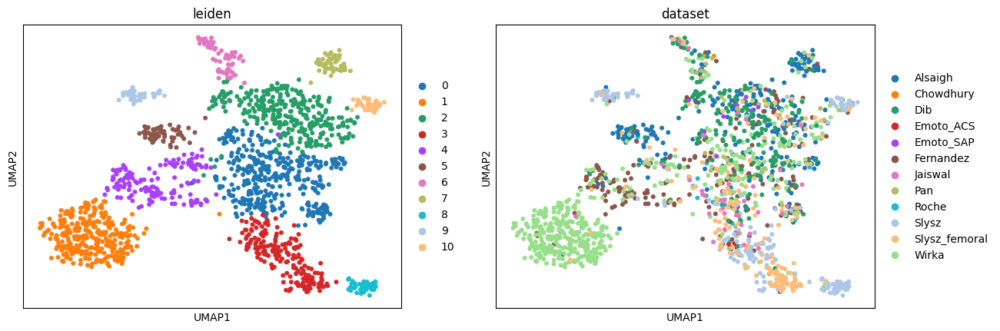

In [128]:
sc.pl.umap(adata_plasma, color= ['leiden', "dataset"])

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

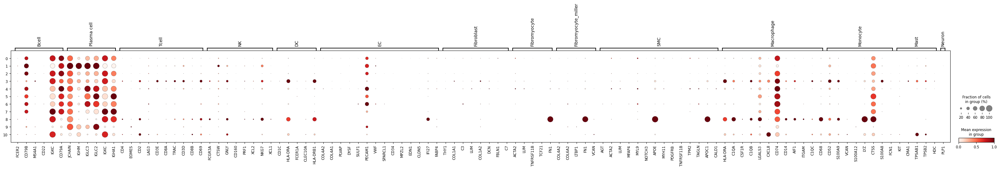

In [131]:
sc.pl.dotplot(
    adata_plasma,
    groupby="leiden",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [132]:
corrected_annotation = {
    "0": "Plasma cell", 
    "1": "Plasma cell",
    "2": "Plasma cell",
    "3": "Plasma cell",
    "4": "Plasma cell",
    "5": "Plasma cell",
    "6": "Plasma cell",
    "7": "Plasma cell",
    "8": "unknown",
    "9": "Plasma cell",
    "10": "unknown",
}
adata_plasma.obs["cell_type_level1_corrected"] = adata_plasma.obs.leiden.map(corrected_annotation)

In [133]:
adata_plasma.write("tmp_plasma_adata_mse3-reload-harm-corrected.h5ad")

# Create new h5ad object

In [171]:
adata = sc.read_h5ad("Altas_level1-noprototypes-allgenes-names-mse3-reload.h5ad") # same as loaded at the top

In [172]:
adata_plasma = sc.read_h5ad("tmp_plasma_adata_mse3-reload-harm-corrected.h5ad")
adata_mast = sc.read_h5ad("tmp_mast_adata_mse3-reload-harm-corrected.h5ad")
adata_fibrossmc = sc.read_h5ad("tmp_fibrossmc_adata_mse3-reload-harm-corrected.h5ad")
adata_mono = sc.read_h5ad("tmp_mono_adata_mse3-reload-harm-corrected.h5ad")
adata_bc = sc.read_h5ad("tmp_Bcells_adata_mse3-reload-harm-corrected.h5ad")
adata_nk = sc.read_h5ad("tmp_nk_adata_mse3-reload-harm-corrected.h5ad")
adata_dc = sc.read_h5ad("tmp_DC_adata_mse3-reload-harm-corrected2.h5ad") # with new pDCs
adata_macros = sc.read_h5ad("tmp_macros_adata_mse3-reload-harm-corrected2.h5ad") # with new pDCs
adata_ec = sc.read_h5ad("tmp_ecs_adata_mse3-reload-harm-corrected.h5ad")
adata_tc = sc.read_h5ad("tmp_Tcells_adata_mse3-reload-harm-corrected.h5ad")

In [173]:
adata_list = [adata_plasma, adata_mast, adata_fibrossmc, adata_mono, adata_bc,adata_nk,adata_dc,adata_macros,adata_ec,adata_tc]

In [174]:
adata_concat = anndata.concat(adata_list, join='outer', fill_value=0.0)

In [175]:
# Extract barcodes and cell_type_level2 values
barcodes = adata_concat.obs_names
cell_types_level2 = adata_concat.obs["cell_type_level1_corrected"]

# Create the mapping
mapping = dict(zip(barcodes, cell_types_level2))

In [176]:
# init new column
adata.obs["cell_type_level1_corrected"] = "no map"

In [177]:
# Update "cell_type_level2" in adata for matching barcodes
for barcode in adata.obs_names:
    if barcode in mapping:
        adata.obs.at[barcode, "cell_type_level1_corrected"] = mapping[barcode]

In [178]:
adata.obs["cell_type_level1_corrected"].value_counts()

cell_type_level1_corrected
T cell                99886
Macrophage            16870
unknown               11863
Smooth Muscle Cell     9405
B cell                 8610
Monocyte               8094
NK cell                7177
EC                     6610
Fibroblast             4976
Neutrophil             2985
Dendritic cell         2679
Fibromyocyte           2419
Mast cell              1531
Plasma cell            1530
Name: count, dtype: int64

In [179]:
adata.write("Altas_level1-noprototypes-allgenes-names-mse3-reload-corrected2.h5ad") # used for reference training with new pDC cluster